# Dall-E 3 with Azure Open AI (Text to Image)

DALL-E 3 is the latest image generation model from OpenAI. It features enhanced image quality, more complex scenes, and improved performance when rendering text in images. It also comes with more aspect ratio options. DALL-E 3 is available through OpenAI Studio and through the REST API.

In [1]:
# %pip install openai --upgrade

In [2]:
import datetime
import json
import os
import requests
import openai
import sys

from dotenv import load_dotenv
from openai import AzureOpenAI
from PIL import Image

In [3]:
load_dotenv("azure.env")

# Azure Open AI
openai.api_type: str = "azure"
api_key = os.getenv("OPENAI_API_KEY")
api_base = os.getenv("OPENAI_API_BASE")
api_version = "2023-12-01-preview"
print("Open AI version:", openai.__version__)

Open AI version: 1.3.0


In [4]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [5]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 16-Nov-2023 10:09:45


## Directory to save the generated images

In [6]:
images_dir = "images"

os.makedirs(images_dir, exist_ok=True)

## Function

In [7]:
client = AzureOpenAI(
    api_version=api_version,
    azure_endpoint=api_base,
    api_key=api_key,
)

In [8]:
def dalle3(prompt, size="1792x1024", quality="hd", style="vivid"):
    """
    Dall e3 image
    """
    result = client.images.generate(
        model="dalle3",  # Name of the Dall e3 deployed model
        prompt=prompt,  # Prompt
        n=1,  # Number of images
        size=size,  # 1792x1024 or 1024x1024 or 1024x1792
        quality=quality,  # hd or standard
        style=style,  # natural or vivid
    )
    # Loading the json results
    results = json.loads(result.model_dump_json())
    # Getting the url image (the first one)
    dalleimage = requests.get(results["data"][0]["url"]).content
    # Saving the image as a local file
    dt = str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S").lower())
    image_file = os.path.join(
        images_dir, prompt[:50].replace(",", " ") + "_" + dt + ".png"
    )

    with open(image_file, "wb") as imagefile:
        imagefile.write(dalleimage)

    print(f"\nImage saved: {image_file}")

    # Return the image as a PIL image file
    img = Image.open(image_file)

    return img

## Dall-E3 examples

Un flacon de parfum en métal avec des motifs de fleurs, avec des pétales de roses sur un plateau en acier

Image saved: images/Un flacon de parfum en métal avec des motifs de fl_16nov2023_101012.png


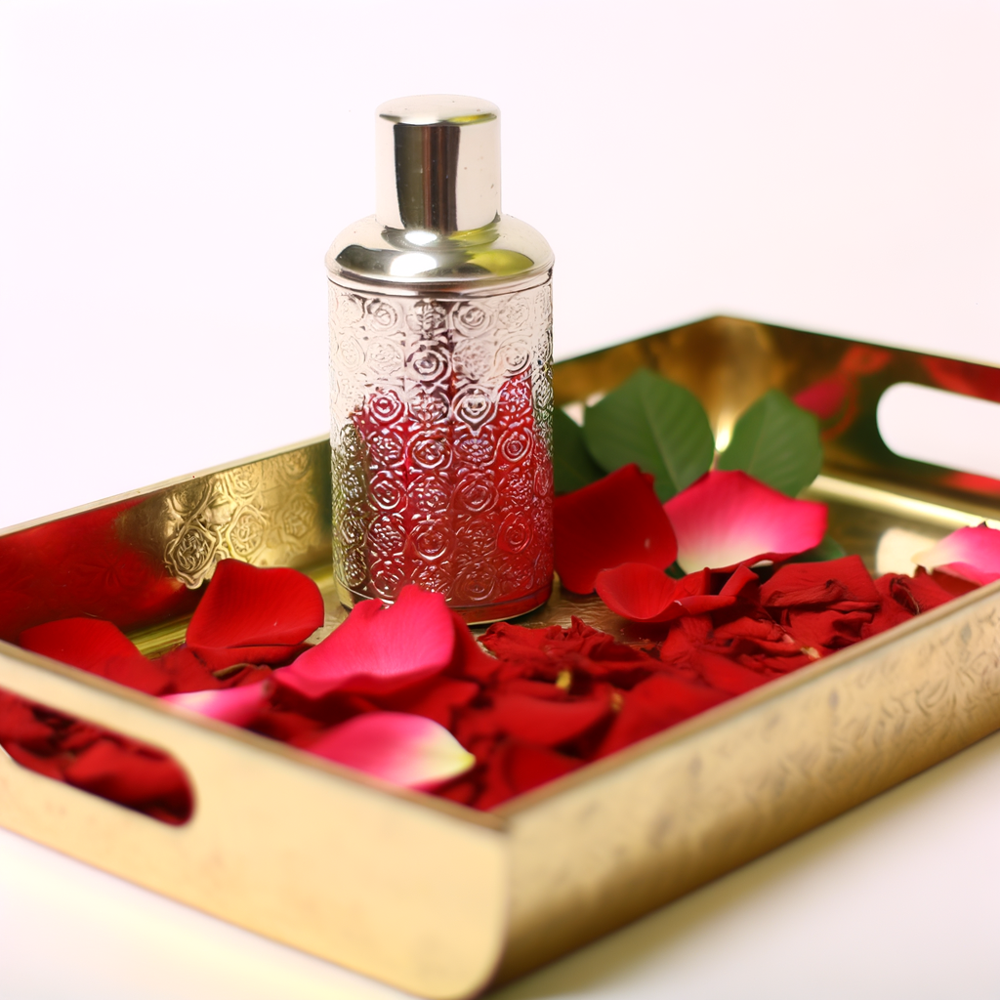

In [9]:
prompt = "Un flacon de parfum en métal avec des motifs de fleurs, avec des pétales de roses \
sur un plateau en acier"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img

A teenage girl of afghani descent with striking rainbow eyes stares at the camera with a deep purple head scarf, Kodachrome film

Image saved: images/A teenage girl of afghani descent with striking ra_16nov2023_101204.png


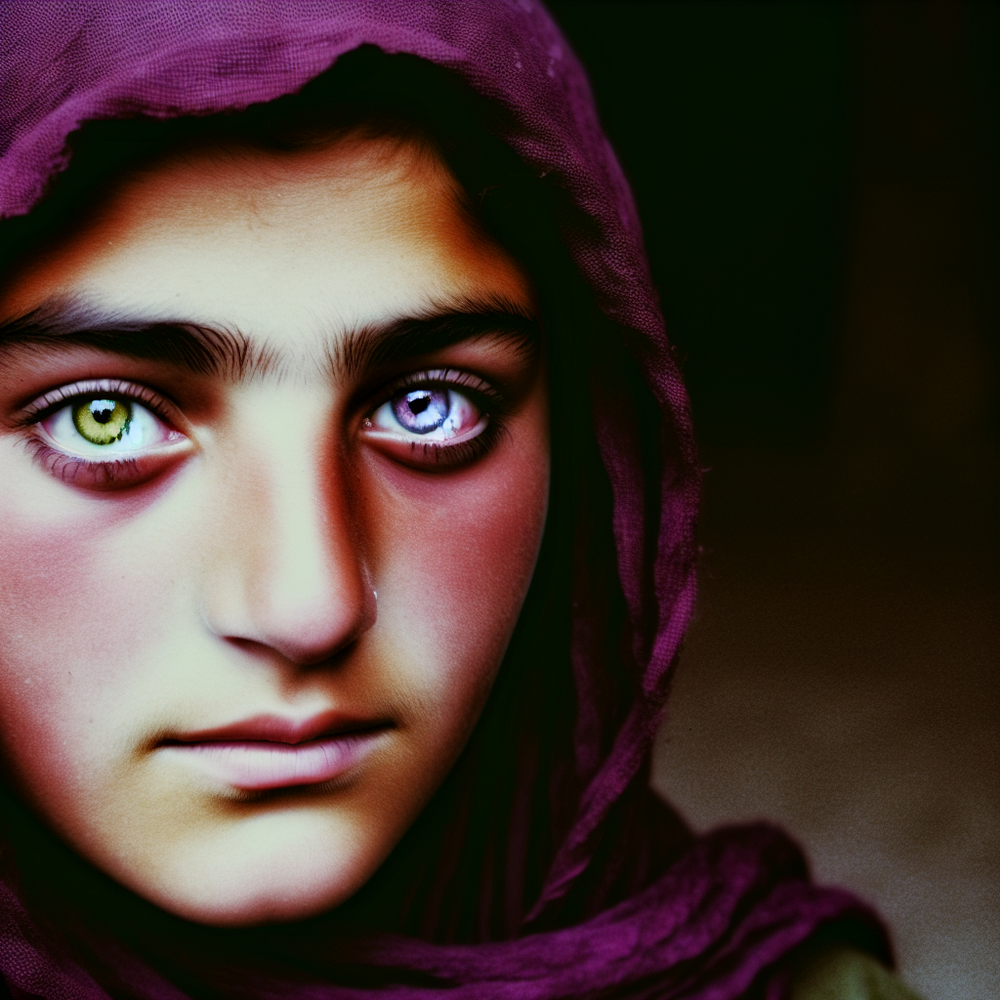

In [14]:
prompt = "A teenage girl of afghani descent with striking rainbow eyes stares \
at the camera with a deep purple head scarf, Kodachrome film"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="standard", style="natural")
img

Delicious ice cream in a half sphere waffle with berries and toppings

Image saved: images/Delicious ice cream in a half sphere waffle with b_16nov2023_101122.png


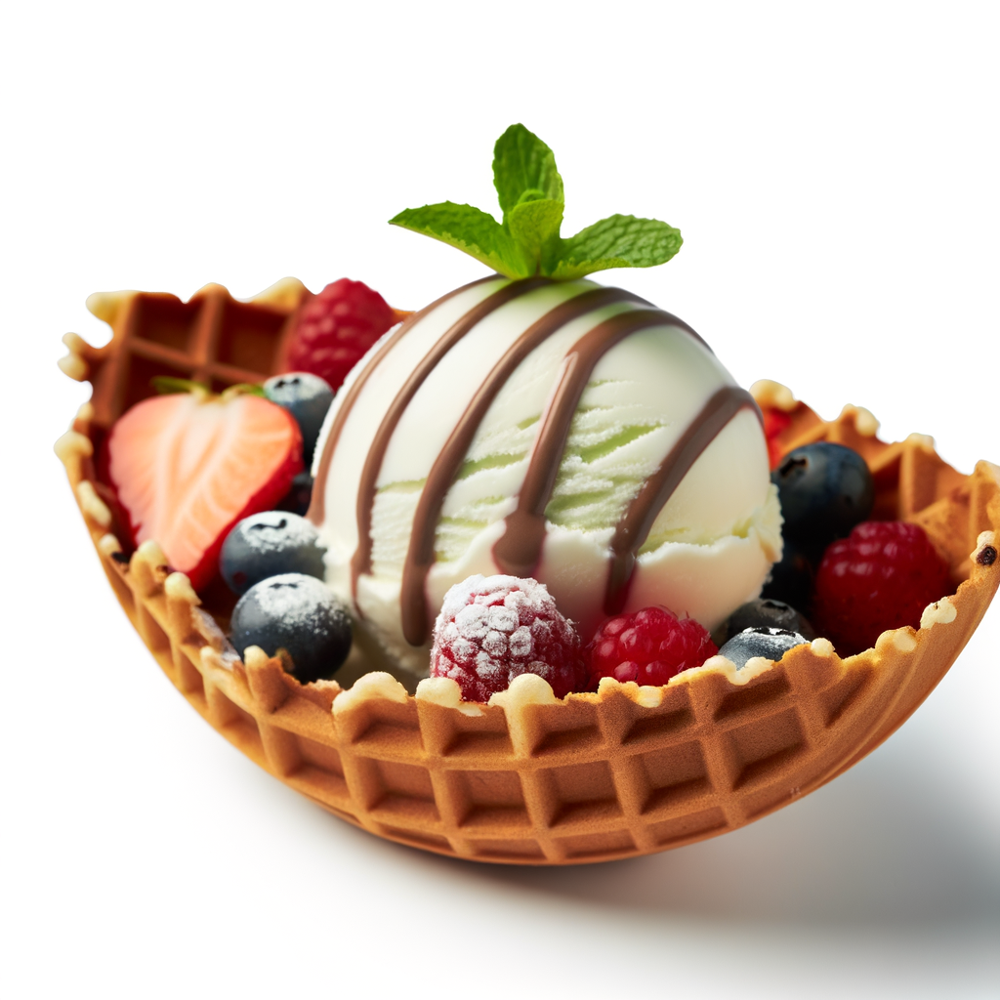

In [12]:
prompt = "Delicious ice cream in a half sphere waffle with berries and toppings"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img

A drummer playing drums on a stage, cartoon style, black and white

Image saved: images/A drummer playing drums on a stage  cartoon style _16nov2023_102358.png


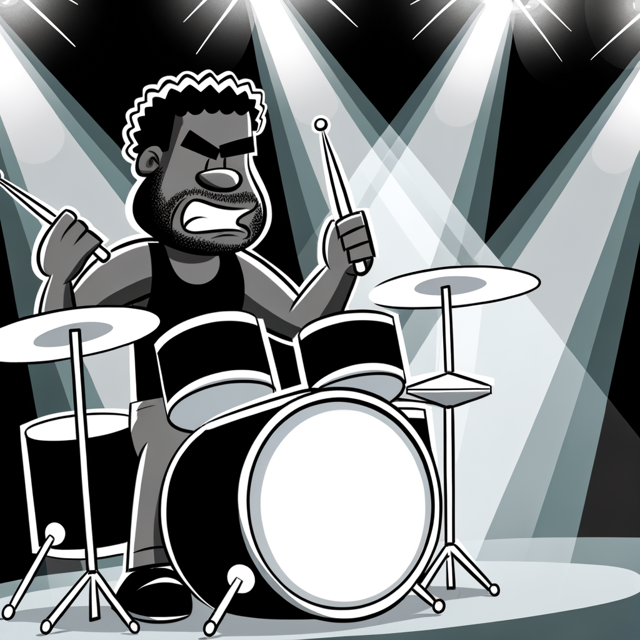

In [15]:
prompt = "A drummer playing drums on a stage, cartoon style, black and white"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img.resize((640, 640))

A New York city busy street with people and cars

Image saved: images/A New York city busy street with people and cars_16nov2023_102606.png


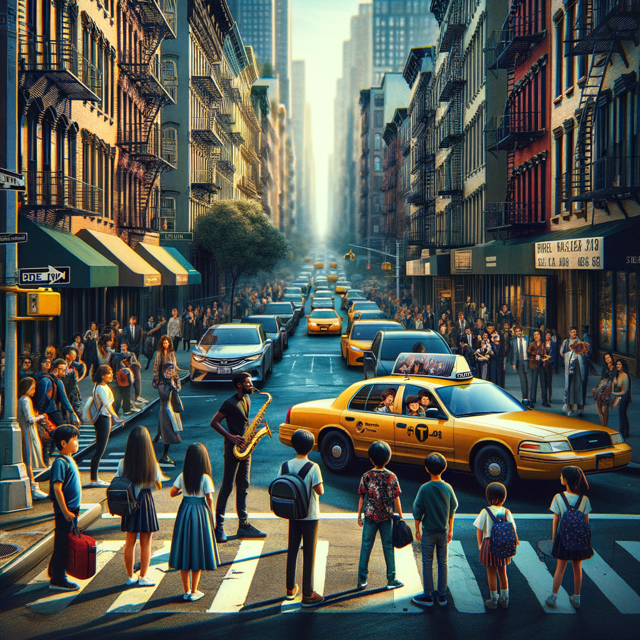

In [16]:
prompt = "A New York city busy street with people and cars"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
img.resize((640, 640))

Photo of a 30-year-old woman with wavy brown hair, wearing professional attire, standing in an office environment, looking determined.

Image saved: images/Photo of a 30-year-old woman with wavy brown hair _16nov2023_102709.png


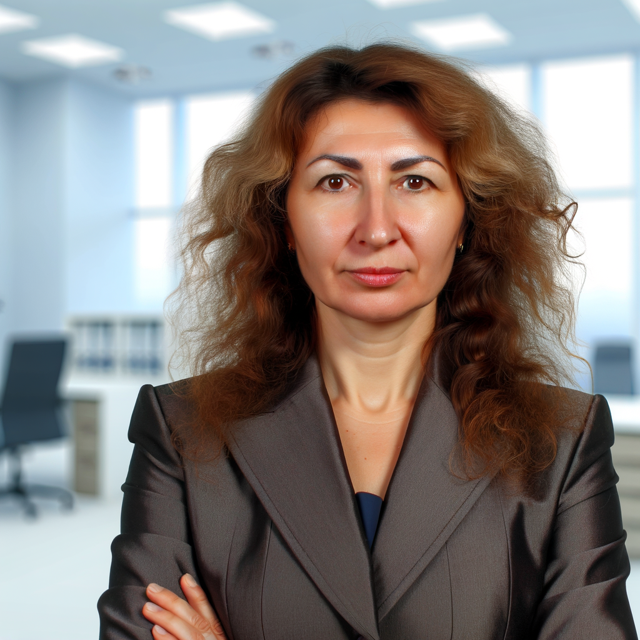

In [18]:
prompt = "Photo of a 30-year-old woman with wavy brown hair, wearing professional attire, \
standing in an office environment, looking determined."
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img.resize((640, 640))

Photo of a 30-year-old man with black hair, wearing professional attire, standing in an office environment, smiling.

Image saved: images/Photo of a 30-year-old man with black hair  wearin_16nov2023_102729.png


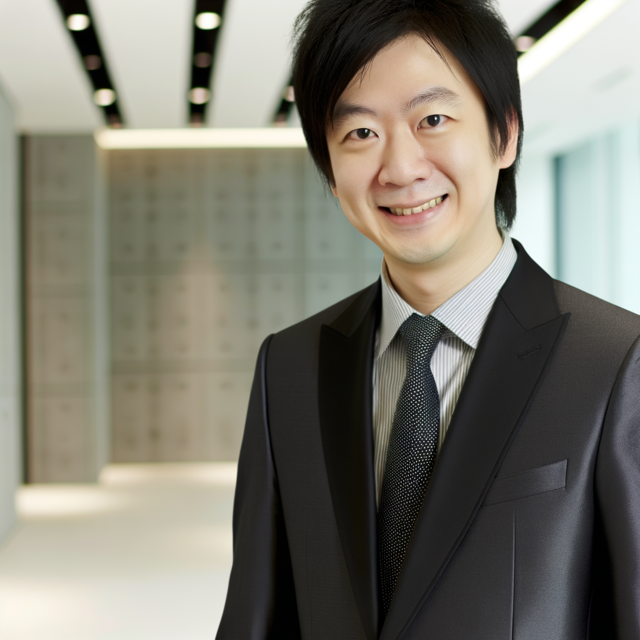

In [19]:
prompt = "Photo of a 30-year-old man with black hair, wearing professional attire, \
standing in an office environment, smiling."
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img.resize((640, 640))

Paris and the Seine river, watercolor, sunny day

Image saved: images/Paris and the Seine river  watercolor  sunny day_16nov2023_102754.png


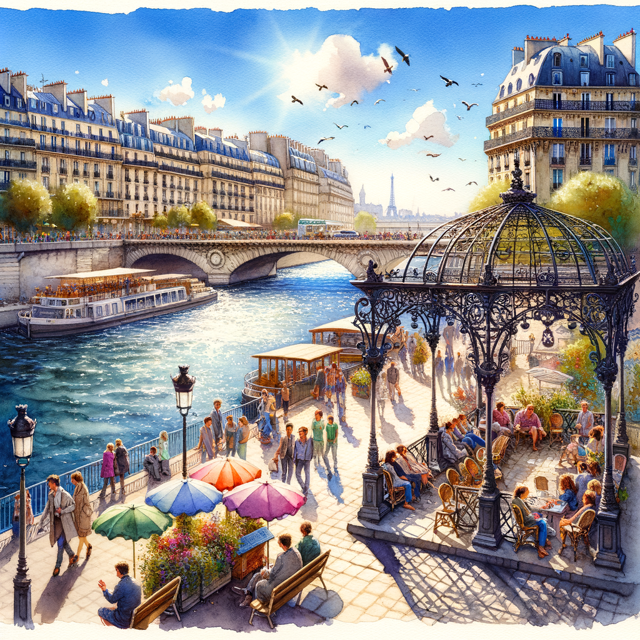

In [20]:
prompt = "Paris and the Seine river, watercolor, sunny day"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
img.resize((640, 640))

Professional photoshoot of a Chemex brewer in the process of brewing coffee.

Image saved: images/Professional photoshoot of a Chemex brewer in the _16nov2023_102920.png


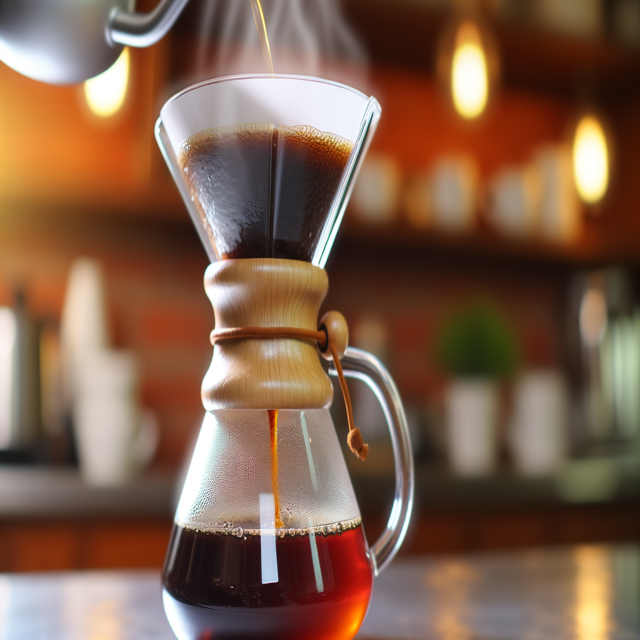

In [22]:
prompt = "Professional photoshoot of a Chemex brewer in the process of brewing coffee."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="natural")
img.resize((640, 640))

A man wearing a top hat and smoking a pipe sitting beside a window in a cafeteria while it rains outside in the style of Renoir, realist painting

Image saved: images/A man wearing a top hat and smoking a pipe sitting_16nov2023_102943.png


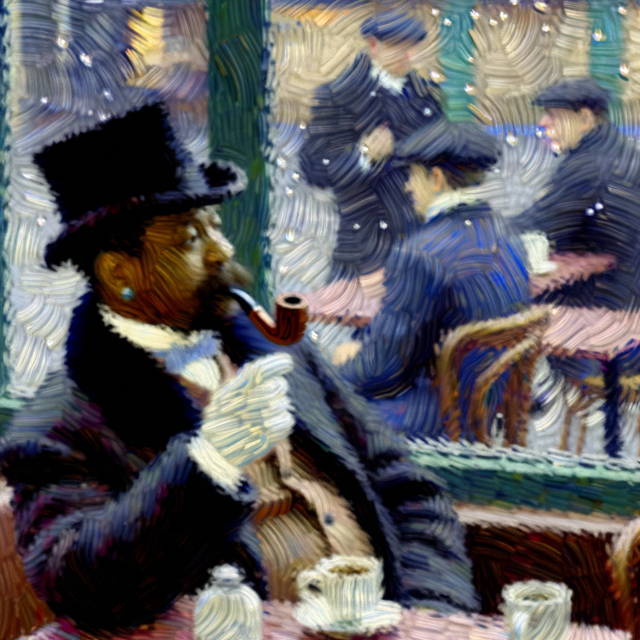

In [23]:
prompt = "A man wearing a top hat and smoking a pipe sitting beside a window \
in a cafeteria while it rains outside in the style of Renoir, realist painting"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img.resize((640, 640))

Beautiful Na'vi under water, avatar, photorealistic, James Cameron, insane details

Image saved: images/Beautiful Na'vi under water  avatar  photorealisti_16nov2023_103008.png


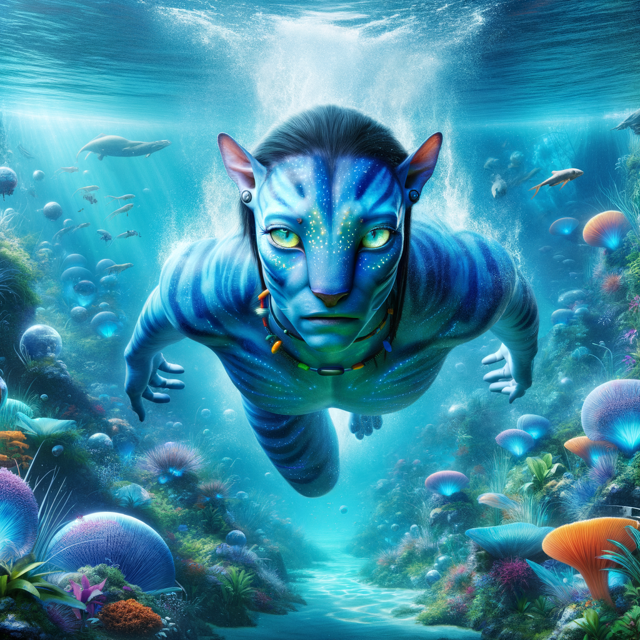

In [24]:
prompt = (
    "Beautiful Na'vi under water, avatar, photorealistic, James Cameron, insane details"
)
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
img.resize((640, 640))

Children playing in the street, realistic, in the style of Edward Hopper

Image saved: images/Children playing in the street  realistic  in the _16nov2023_103033.png


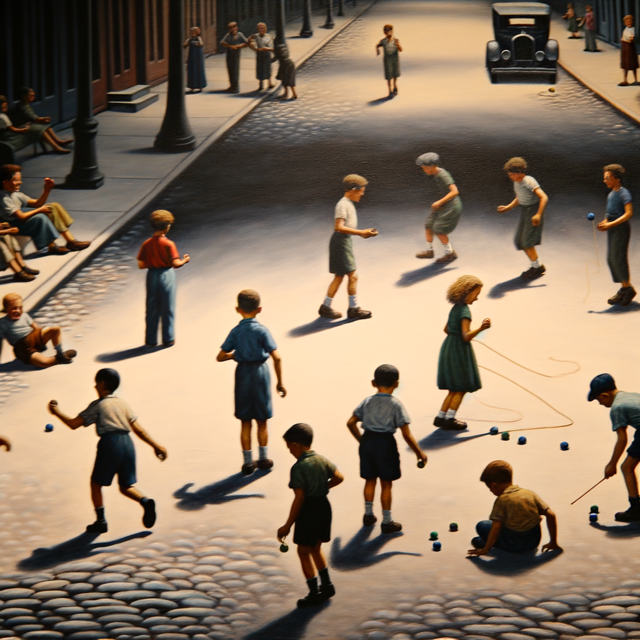

In [25]:
prompt = "Children playing in the street, realistic, in the style of Edward Hopper"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img.resize((640, 640))

Children playing in the street in the style of Andy Warhol

Image saved: images/Children playing in the street in the style of And_16nov2023_103056.png


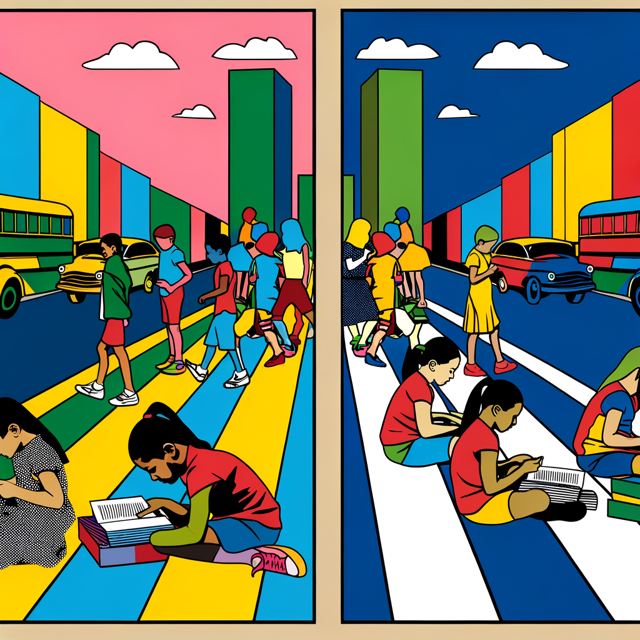

In [26]:
prompt = "Children playing in the street in the style of Andy Warhol"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
img.resize((640, 640))

Early morning photography of a landscape shrouded in mist, with diffused light and long shadows.

Image saved: images/Early morning photography of a landscape shrouded _16nov2023_103127.png


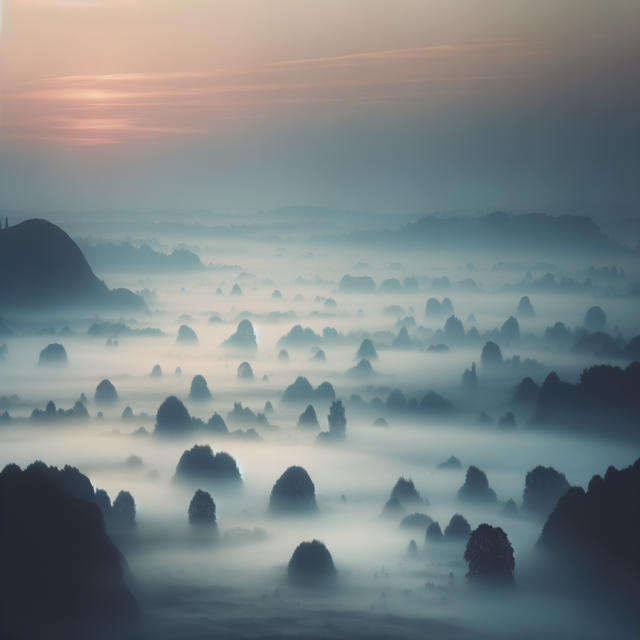

In [27]:
prompt = "Early morning photography of a landscape shrouded in mist, with diffused light and long shadows."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="vivid")
img.resize((640, 640))

Landscape photography of snow-covered mountain peaks at sunrise, using natural light.

Image saved: images/Landscape photography of snow-covered mountain pea_16nov2023_103200.png


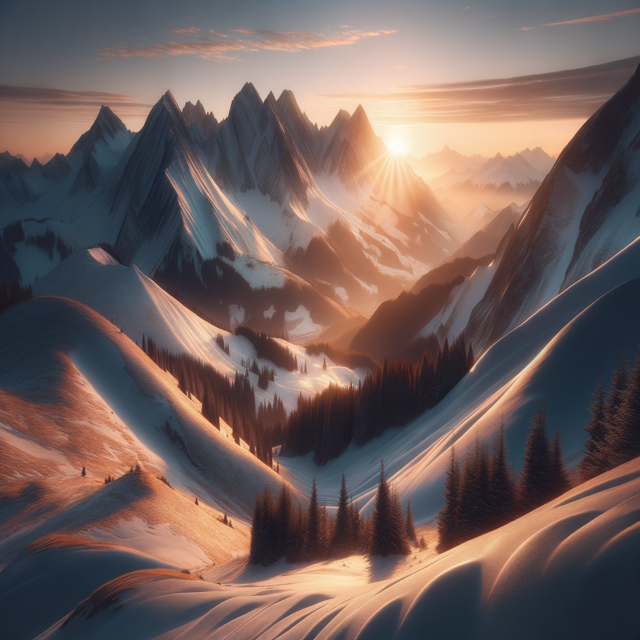

In [28]:
prompt = "Landscape photography of snow-covered mountain peaks at sunrise, using natural light."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="vivid")
img.resize((640, 640))